In [0]:
#import required packages and libraries
#Using Keras with tensorflow as the backend

from google.colab import drive
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.models import Sequential , Model
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import backend as K
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
import numpy as np
from keras import models
from keras import layers
from keras import optimizers

#Mount Google drive to access image files ( Optional)
drive.mount("/content/drive")



Using TensorFlow backend.


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#Generate a VGG16 model to be the foundation. 
conv_base = VGG16(include_top=False, weights='imagenet', input_shape = (300, 300, 3))
conv_base.summary()



Instructions for updating:
Colocations handled automatically by placer.
58892288/58889256 [==============================] - 2s 0us/step
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 300, 300, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 300, 300, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 300, 300, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 150, 150, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 150, 150, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 150, 150, 128)     147584    
_____

In [0]:
#Freeze weights of all the layers in the VGG16 base generated in the previous step

for layer in conv_base.layers:
    layer.trainable = False
    
for layer in conv_base.layers:
    print(layer.name, layer.trainable)

input_1 False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 False
block5_conv2 False
block5_conv3 False
block5_pool False


In [0]:
#Add more layers on top. At the end, specify the number of categories (9 in our case) and 'softmax' since we have multiple categories

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(9, activation='softmax'))

model.summary()

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 9, 9, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 41472)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              42468352  
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 9)                 9225      
Total params: 57,192,265
Trainable params: 42,477,577
Non-trainable params: 14,714,688
_________________________________________________________________


In [0]:
# Data augmentation used since the number of images are on the lower end (~11000 images). Vertical flip was performed externally.  Target image size set to 300px X 300px

train_batchsize = 30
val_batchsize = 30


# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        rescale=1./255,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_directory(
        '/content/drive/My Drive/Google_Colab/PombEyeV2/train',  # this is the target directory
        target_size=(300, 300),  
        batch_size=train_batchsize,
        shuffle=True,
        class_mode='categorical')


validation_generator = validation_datagen.flow_from_directory(
        '/content/drive/My Drive/Google_Colab/PombEyeV2/validation',
        target_size=(300, 300),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

Found 11214 images belonging to 9 classes.
Found 1506 images belonging to 9 classes.


In [0]:
#Generating the weights of the fine tuned model. 'PombEye_VGG16-V.h5' was renamed to 'PombEye_V1.h5'in the Github repo

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])
# Train the model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=120 ,
      epochs=50,
      validation_data=validation_generator,
      validation_steps=50)
 
# Save the model
model.save('PombEye_VGG16-V.h5')

Instructions for updating:
Use tf.cast instead.
Epoch 1/50
120/120 [==============================] - 1495s 12s/step - loss: 1.3673 - acc: 0.6292 - val_loss: 0.9535 - val_acc: 0.6760
Epoch 2/50
120/120 [==============================] - 1050s 9s/step - loss: 0.9201 - acc: 0.7108 - val_loss: 0.7793 - val_acc: 0.7466
Epoch 3/50
120/120 [==============================] - 1117s 9s/step - loss: 0.8420 - acc: 0.7292 - val_loss: 0.7684 - val_acc: 0.7317
Epoch 4/50
120/120 [==============================] - 200s 2s/step - loss: 0.8145 - acc: 0.7453 - val_loss: 0.8175 - val_acc: 0.7161
Epoch 5/50
120/120 [==============================] - 86s 715ms/step - loss: 0.7769 - acc: 0.7522 - val_loss: 0.7953 - val_acc: 0.7175
Epoch 6/50
120/120 [==============================] - 87s 724ms/step - loss: 0.7525 - acc: 0.7578 - val_loss: 0.7095 - val_acc: 0.7771
Epoch 7/50
120/120 [==============================] - 88s 731ms/step - loss: 0.7387 - acc: 0.7606 - val_loss: 0.6969 - val_acc: 0.7568
Epoch 8/50


In [0]:
#Copy weight file from Google Colab working directory to Google drive ( working directory erases data after disconnection)

from shutil import copyfile

copyfile('/content/PombEye_VGG16-V.h5', '/content/drive/My Drive/Google_Colab/PombEyeV2/PombEye_VGG16-beta1.h5')

'/content/drive/My Drive/Google_Colab/PombEyeV2/PombEye_VGG16-beta1.h5'

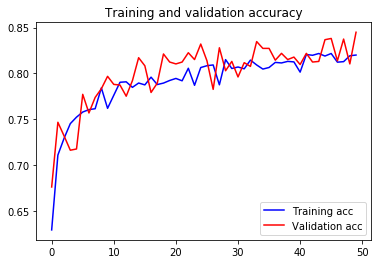

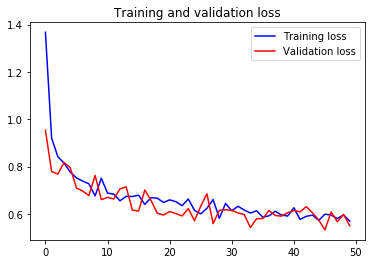

In [0]:
#generate Accuracy vs Epoch and loss vs Epoch plots

import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

Found 1506 images belonging to 9 classes.
51/50 [==============================] - 14s 280ms/step
No of errors = 253/1506


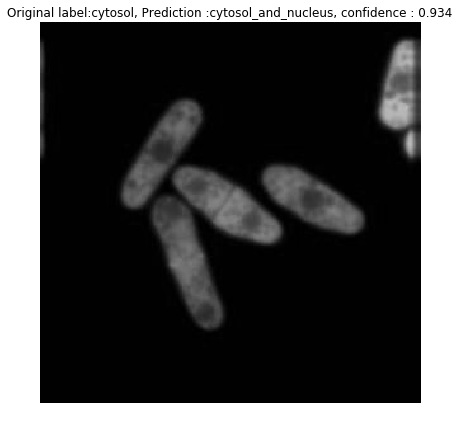

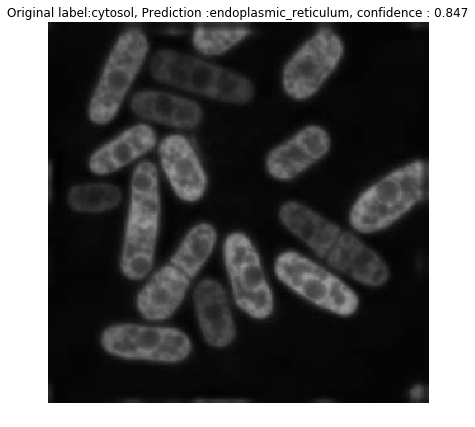

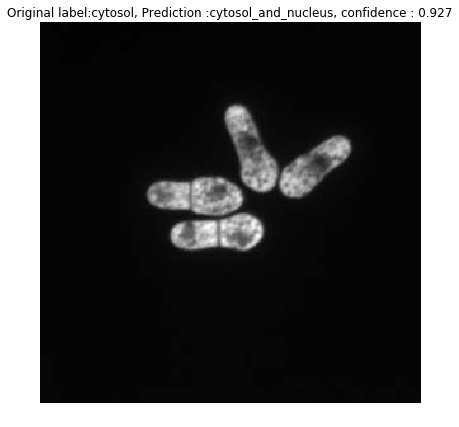

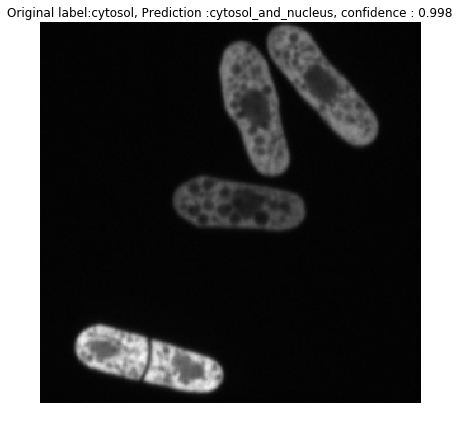

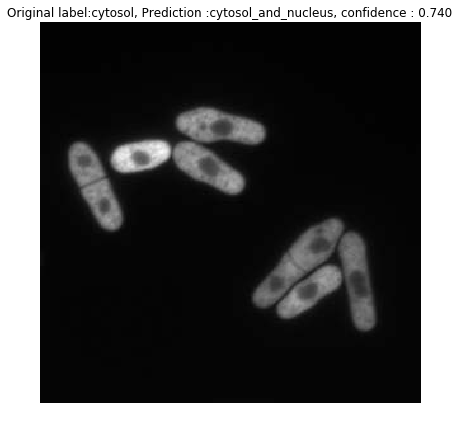

...

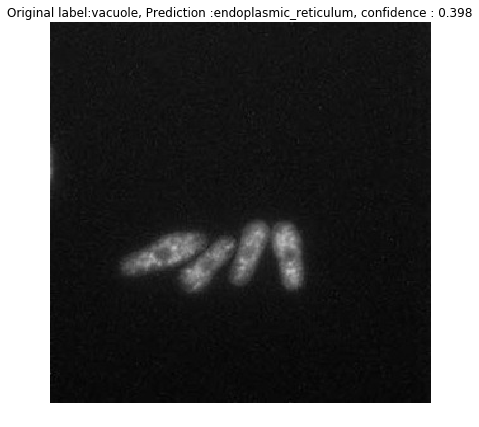

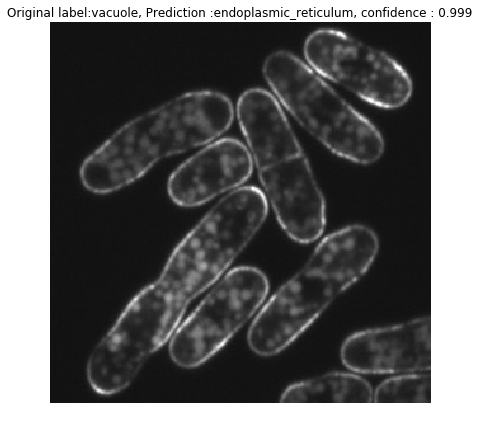

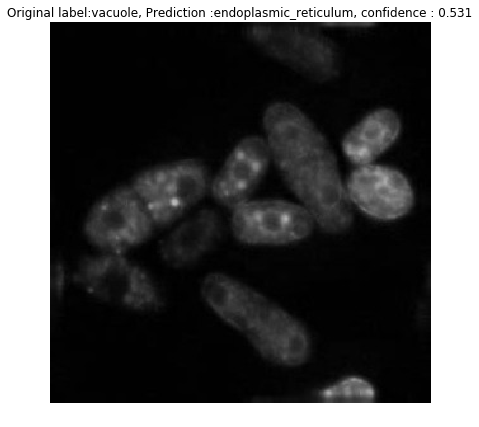

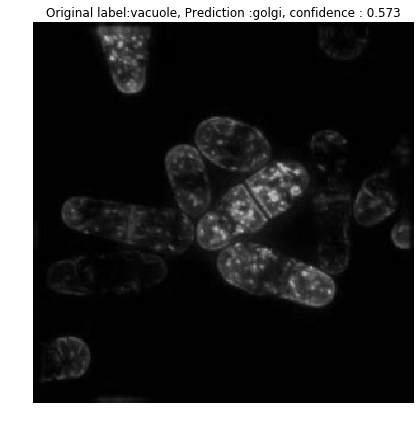

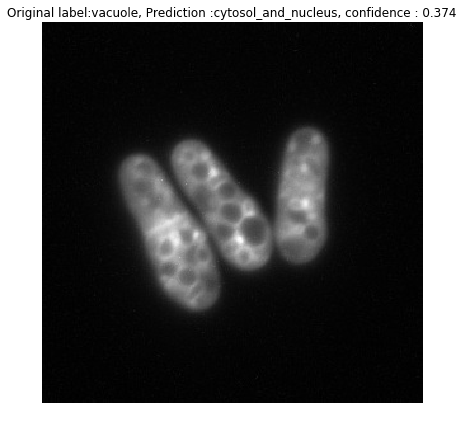

In [0]:
# Show the images and their categories that were wrongly predicted during validation steps. 


# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        '/content/drive/My Drive/Google_Colab/PombEyeV2/validation',
        target_size=(300, 300),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)
 
# Get the filenames from the generator
fnames = validation_generator.filenames
 
# Get the ground truth from generator
ground_truth = validation_generator.classes
 
# Get the label to class mapping from the generator
label2index = validation_generator.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())
 
# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)
 
errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))
 
# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
     
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
     
    original = load_img('{}/{}'.format('/content/drive/My Drive/Google_Colab/PombEyeV2/validation',fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

In [0]:
#Predicting new images using the fine-tuned model

import numpy as np
from keras.preprocessing import image
test_image = image.load_img('/content/drive/My Drive/Google_Colab/PombEyeV2/37F06_2Y.jpg', target_size = (300, 300))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
test_image = test_image.astype("float") / 255.0

categories = {'Cytosol': 0,
 'Cytosol and Nucleus': 1,
 'Endoplasmic reticulum': 2,
 'Golgi': 3,
 'Microtubules': 4,
 'Mitochondrion': 5,
 'Nucleus': 6,
 'Periphery': 7,
 'Vacuole': 8}
result = model.predict(test_image)

print("Prediction", " : ", "Confidence score")
for classes, number in categories.items():
  if number == result.argmax():
    print(classes, " : ", round(np.amax(result)*100,2),"\n\n")


for classes, number in categories.items():
    print(classes, " " , round(result.item(number)*100,2))
    


Prediction  :  Confidence score
Endoplasmic reticulum  :  46.5 


Cytosol   4.22
Cytosol and Nucleus   29.54
Endoplasmic reticulum   46.5
Golgi   4.67
Microtubules   0.04
Mitochondrion   0.79
Nucleus   9.59
Periphery   4.38
Vacuole   0.27
